## Install SAM2 before running

In [1]:
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd /kaggle/working/segment-anything-2
%pip install -e .
%cd /kaggle/working/segment-anything-2/checkpoints/
!bash /kaggle/working/segment-anything-2/checkpoints/download_ckpts.sh
%cd /kaggle/working/segment-anything-2/

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 974, done.
remote: Counting objects: 100% (382/382), done.
remote: Compressing objects: 100% (158/158), done.
remote: Total 974 (delta 239), reused 224 (delta 224), pack-reused 592 (from 1)
Receiving objects: 100% (974/974), 121.67 MiB | 37.64 MiB/s, done.
Resolving deltas: 100% (340/340), done.
/kaggle/working/segment-anything-2
Obtaining file:///kaggle/working/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━

## Imports

In [8]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os 
from collections import OrderedDict

import torch
import torch.nn as nn
from torchvision.utils import draw_bounding_boxes
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torchvision.utils import draw_segmentation_masks, draw_bounding_boxes
from torchvision.io import read_image
from torchvision.ops import masks_to_boxes
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

In [3]:
import sys
sys.path.append('/kaggle/input/custom-resnet/pytorch/default/1')

from resnet import testing as resnet50

## Paths and inputs

In [4]:
image_path = '/kaggle/input/composite-image/image1.jpg' 
model_ckpt = '/kaggle/input/resnet50-finetuned/pytorch/default/1/resnet50_pretrained_v1.pth'
image = Image.open(image_path).convert("RGB")

## Generate segmentation masks

In [14]:
import numpy as np
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

mask_generator = SAM2AutomaticMaskGenerator.from_pretrained("facebook/sam2-hiera-large")
np_image = np.array(image.convert("RGB"))
masks = mask_generator.generate(np_image)

# print(len(masks))
# print(masks[0].keys())

sam2_hiera_large.pt:   0%|          | 0.00/898M [00:00<?, ?B/s]

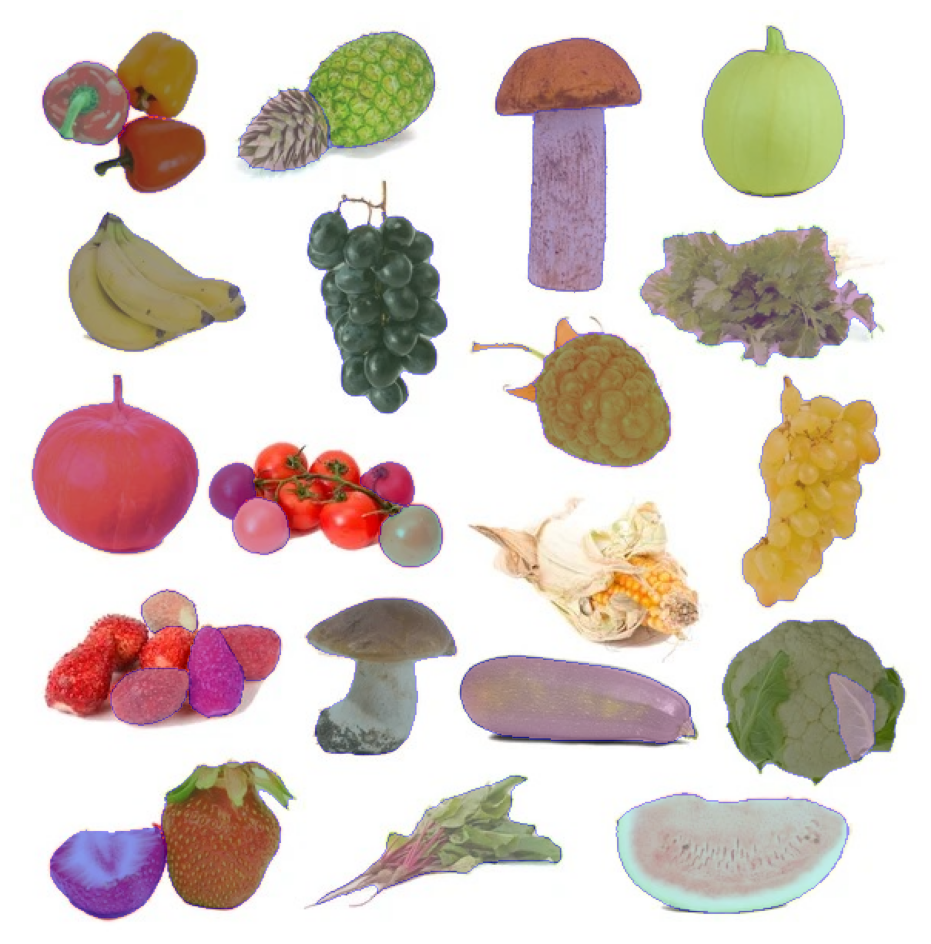

In [15]:
# Visualize the segmentation masks
plt.figure(figsize=(12, 12))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

36


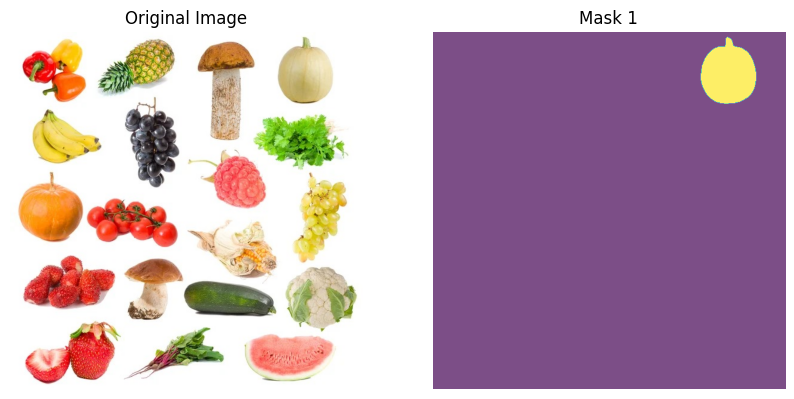

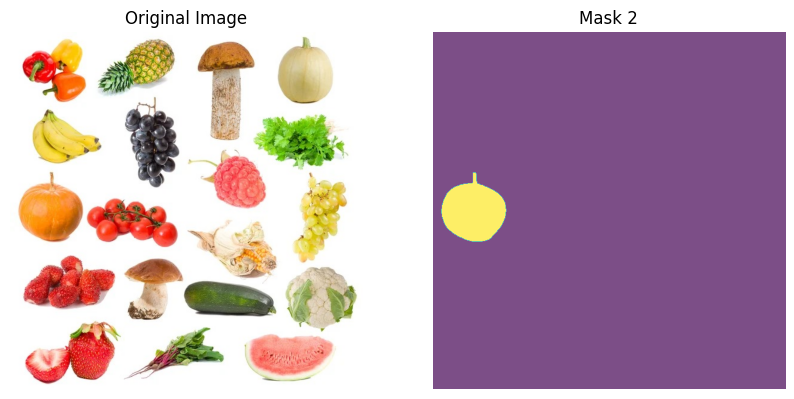

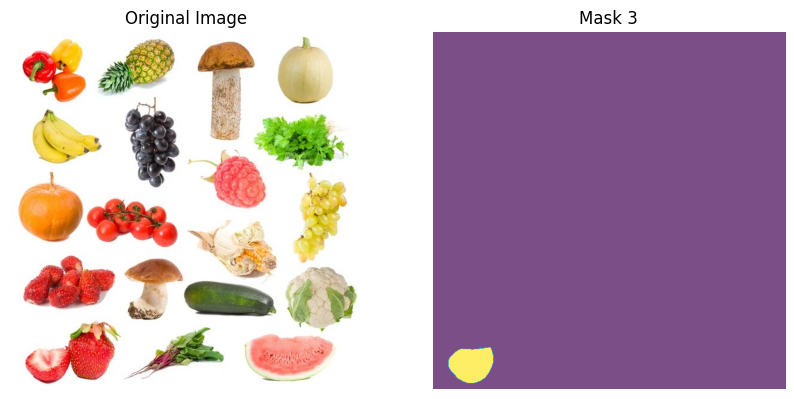

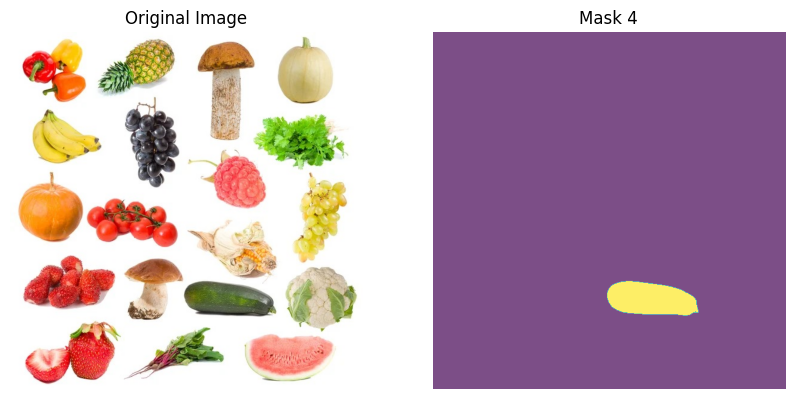

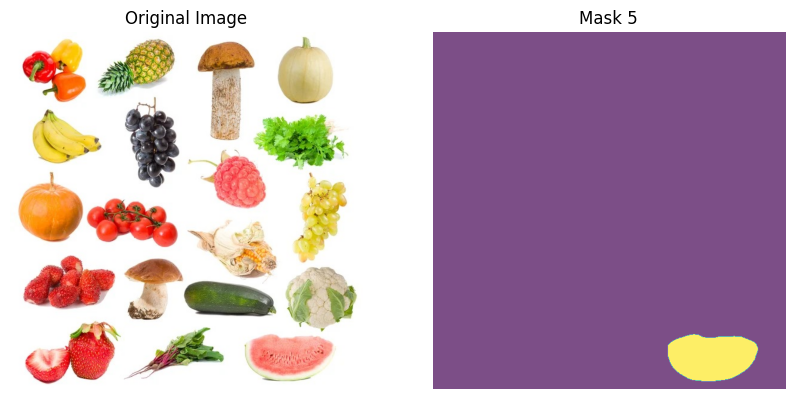

...

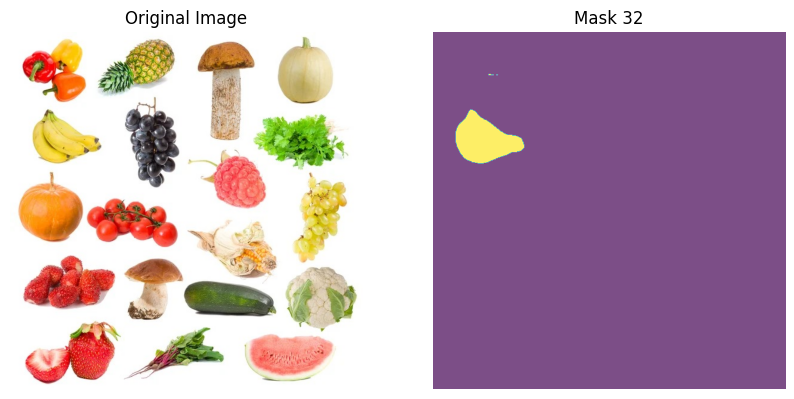

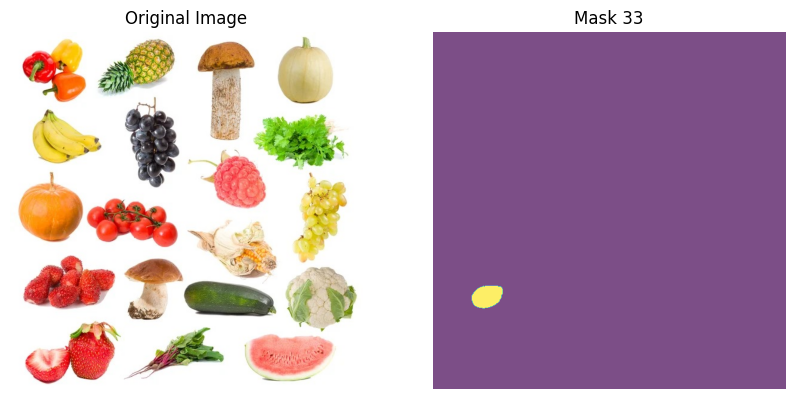

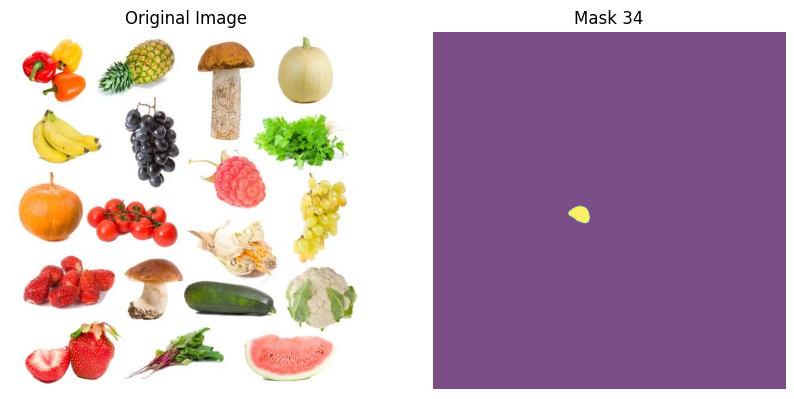

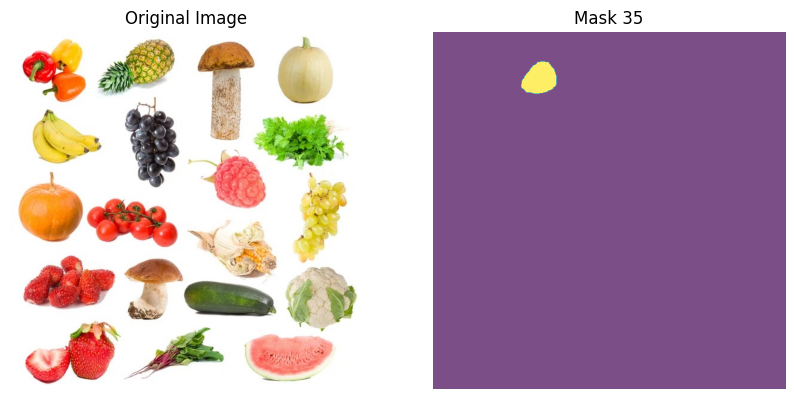

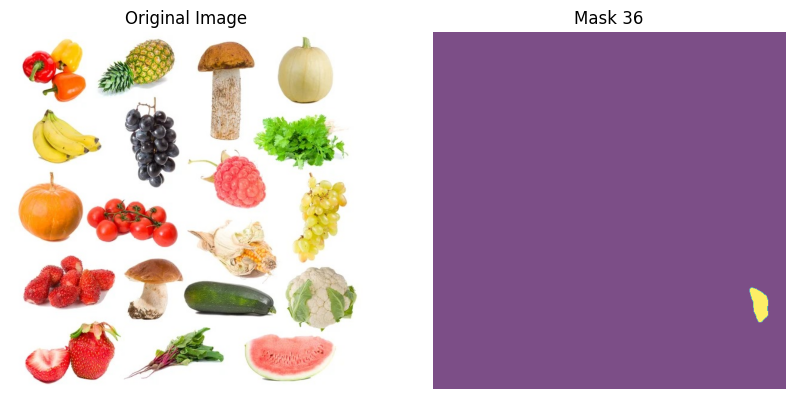

In [194]:
# print masks of individual objects 
print(len(masks))
for i, x in enumerate(masks):
    mask = x['segmentation']
    plt.figure(figsize=(10, 5))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    # Mask visualization
    plt.subplot(1, 2, 2)
    if mask.dtype != np.uint8:
        mask = (mask * 255).astype(np.uint8)  # Scale mask to 0-255 if needed
    plt.imshow(mask, cmap="viridis", alpha=0.7)  # Adjust alpha for transparency
    plt.title(f"Mask {i+1}")
    plt.axis("off")

    plt.show()

## Get object bounding boxes from segmentation masks

In [16]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

image_tensor = read_image(image_path)
if image_tensor.shape[0] > 3:
    image_tensor = image_tensor[:3, :, :]
f = [torch.from_numpy(masks[i]['segmentation']) for i in range(len(masks))]
f = torch.stack(f, dim=0)
# print(f.shape)
# print(image_tensor.shape)

torch.Size([36, 4])


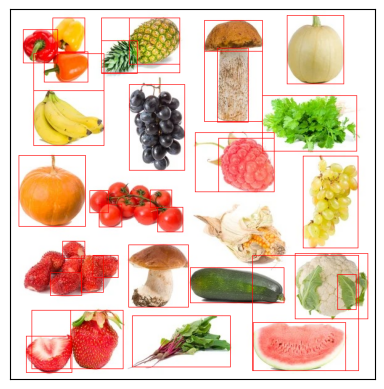

In [17]:
# Visualize bounding boxes 
boxes = masks_to_boxes(f)
print(boxes.size())
# print(boxes)

drawn_boxes = draw_bounding_boxes(
    image_tensor, 
    boxes, 
    colors="red"
 # Optional: Specify the font (ensure the font file is accessible)
)
show(drawn_boxes)

In [197]:
# visualize ANY one crop (bounding box)

# x1, y1, x2, y2 = [int(coord) for coord in boxes[1]]

# crop = image_tensor[:, y1:y2, x1:x2]
# crop = crop.permute(1, 2, 0).numpy()

# plt.imshow(crop)

## Cropping the objects from the composite image 

In [21]:
# Function to crop bounding boxes and save them
def crop_and_save(image_tensor, boxes, save_dir):
    os.makedirs(save_dir, exist_ok=True)  # Create directory if it doesn't exist
    crops = []
    for i, box in enumerate(boxes):
        # Convert box coordinates to integers
        x_min, y_min, x_max, y_max = box.int()
        
        # Crop the region using slicing
        cropped_region = image_tensor[:, y_min:y_max, x_min:x_max]
        cropped_region = cropped_region.permute(1,2,0).numpy()
        
        # Convert to PIL image
        cropped_image = Image.fromarray(cropped_region.astype(np.uint8))

        # Increase resolution
        new_size = (cropped_image.width * 3, cropped_image.height * 3)
        cropped_image_resized = cropped_image.resize(new_size, Image.LANCZOS)
        crops.append(cropped_image_resized)
        
        # Save the image
        save_path = os.path.join(save_dir, f"crop_{i+1}.jpg")
        
        cropped_image_resized.save(save_path, dpi=(800, 800))
        # print(f"Saved crop {i+1} to {save_path}")
    
    return crops

# Define the directory to save cropped images
save_directory = "/kaggle/working/cropped_images/"

import shutil
import os
if os.path.exists(save_directory):
    shutil.rmtree(save_directory)

# Call the function
cropped_images = crop_and_save(image_tensor, boxes, save_directory)

# import os
# print(os.listdir("/kaggle/working/cropped_images"))
# print(len(os.listdir("/kaggle/working/cropped_images")))

In [22]:
# Define the custom dataset
class CroppedImageDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))])
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_path).convert("RGB") 
        if self.transform:
            image = self.transform(image)
        return image, img_path  

transform = transforms.Compose([
            transforms.Resize((224, 224)),               # Resize image to 256x256
            transforms.ToTensor(),                      # Convert image to tensor
            transforms.Normalize(mean=(0.485, 0.456, 0.406),  # Normalize using ImageNet stats
                         std=(0.229, 0.224, 0.225)),
])


cropped_dataset = CroppedImageDataset(image_dir="/kaggle/working/cropped_images", transform=transform)

In [24]:
class ConvAutoencoder(nn.Module):
    def __init__(self, latent_dim=256):
        super(ConvAutoencoder, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            # Input: 3 x 224 x 224
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),  # -> 32 x 112 x 112
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # -> 64 x 56 x 56
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # -> 128 x 28 x 28
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # -> 256 x 14 x 14
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # -> 512 x 7 x 7
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            
            nn.Flatten(),  # -> 512 * 7 * 7
            nn.Linear(512 * 7 * 7, latent_dim)  # -> latent_dim
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 512 * 7 * 7),  # -> 512 * 7 * 7
            nn.ReLU(True),
            
            nn.Unflatten(1, (512, 7, 7)),  # -> 512 x 7 x 7
            
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # -> 256 x 14 x 14
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # -> 128 x 28 x 28
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # -> 64 x 56 x 56
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),  # -> 32 x 112 x 112
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),  # -> 3 x 224 x 224
            nn.Tanh()  # Output range: [-1, 1]
        )
        
    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent

In [25]:
from torch.nn import DataParallel
autoencoder = ConvAutoencoder(latent_dim=512).to('cuda')
autoencoder = DataParallel(autoencoder)
autoencoder.load_state_dict(torch.load('/kaggle/input/autoencoder-best/pytorch/default/1/best_autoencoder.pth'))

criterion = nn.MSELoss()

## Initialize model and run inference on the image crops 

In [52]:
# confidence threshold for returning the prediction of an object or not 
THRESHOLD = 0.0

In [53]:
# Load the custom ResNet-50 model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

state_dict = torch.load(model_ckpt, map_location=device)

new_state_dict = OrderedDict()
for k, v in state_dict.items():
    if k.startswith("module."):
        new_state_dict[k[7:]] = v  # Remove "module."
    else:
        new_state_dict[k] = v

# Initialize the model
num_classes = 30 
model = resnet50(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

# Load the updated state dict
model.load_state_dict(new_state_dict)
model = model.to(device)
model.eval()

masks_saved = []

predicted_labels = []
for i in range(len(cropped_dataset)):
    image, image_path = cropped_dataset[i]
    
    # Add batch dimension (ResNet expects batch format: [N, C, H, W])
    image = image.unsqueeze(0).to(device)
    
    # Perform inference
    with torch.no_grad():
        output = model(image)
    
    # Get the predicted class (index)
    _, predicted_class = output.max(1)

    # Getting the probabilities
    probs = torch.nn.functional.softmax(output, dim=-1)
    highest_prob, _ = torch.max(probs, dim=-1) 
    # print(highest_prob.item())
    mask = highest_prob >= THRESHOLD
    masks_saved.append(mask)
    
    # Store the result in the dictionary (image path as key, predicted class as value)
    predicted_labels.append((image_path, predicted_class.item()))
    
    # Print the result (optional)
    # print(f"Image: {image_path}, Predicted class: {predicted_class.item()}")

# At the end, you have a dictionary with image paths and their corresponding predicted classes
# print(predicted_labels)

# create the mask of objects whose predictions are being shown  
masks_saved = torch.cat(masks_saved)
# print(masks_saved.shape)

final_labels = [predicted_labels[i] for i in range(len(masks_saved)) if masks_saved[i] == True]
# print(len(final_labels))
# image_to_class
boxes_final = [boxes[i] for i in range(len(masks_saved)) if masks_saved[i] == True]
# print(len(boxes_final))


# numeric label to class name mapping
labeltc = {0: 'aloevera', 1: 'banana', 2: 'bilimbi', 3: 'cantaloupe', 4: 'cassava', 5: 'coconut', 6: 'corn', 7: 'cucumber', 
           8: 'curcuma', 9: 'eggplant', 10: 'galangal', 11: 'ginger', 12: 'guava', 13: 'kale', 14: 'longbeans', 15: 'mango', 
           16: 'melon', 17: 'orange', 18: 'paddy', 19: 'papaya', 20: 'peperchili', 21: 'pineapple', 22: 'pomelo', 23: 'shallot', 
           24: 'soybeans', 25: 'spinach', 26: 'sweetpotatoes', 27: 'tobacco', 28: 'waterapple', 29: 'watermelon'}

# numeric labels to string labels map 
image_to_class = {image_path: labeltc[label] for image_path, label in predicted_labels}

# Print the resulting mapping
# for image_path, class_name in image_to_class.items():
    # print(f"{image_path}: {class_name}")
# print(image_to_class)

## Visualize predictions

In [34]:
from torchvision.transforms.functional import to_pil_image

torch.Size([36, 4])


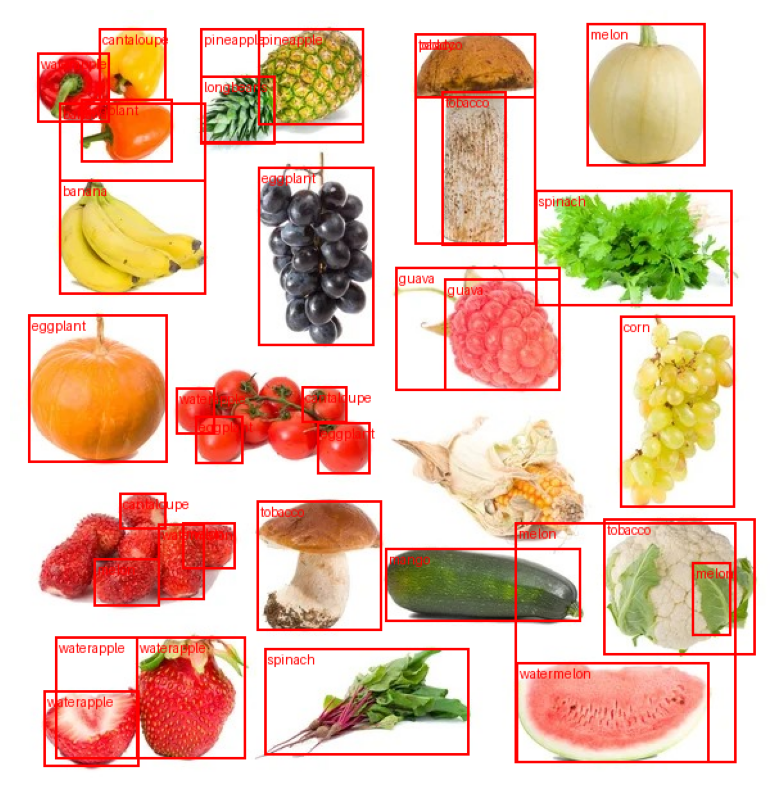

Image with bounding boxes saved to /kaggle/working/image_with_boxes.jpg


In [54]:
# Assuming `boxes`, `predicted_labels`, and `image_tensor` are defined
def draw_boxes_with_labels(image_tensor, boxes, predicted_labels, save_path=None, mask=None):
    # Prepare labels for the bounding boxes
    box_labels = [predicted_labels[f"/kaggle/working/cropped_images/crop_{i+1}.jpg"] for i in range(len(boxes)) if mask[i].item()!=False]
    # Convert labels to strings (class names or indices)
    label_strings = [str(label) for label in box_labels]

    assert len(mask) ==  len(boxes), "len of mask and boxes not same"
    boxes = torch.stack([boxes[i] for i in range(len(mask)) if mask[i]!=False], dim=0)
    print(boxes.shape)
    
    
    # Ensure the image tensor is in the correct format
    image_tensor = image_tensor.clone()
    if image_tensor.dtype != torch.uint8:
        image_tensor = (image_tensor * 255).byte()  # Convert to range [0, 255]
    
    # Draw bounding boxes with labels
    drawn_image = draw_bounding_boxes(
        image_tensor,
        boxes,
        labels=label_strings,
        colors="red",
        width=2
    )
    
    # Convert to PIL Image for visualization or saving
    pil_image = to_pil_image(drawn_image)
    
    # Show the image
    plt.figure(figsize=(10, 10))
    plt.imshow(pil_image)
    plt.axis("off")
    plt.show()
    
    # Optionally save the image
    if save_path:
        pil_image.save(save_path)
        print(f"Image with bounding boxes saved to {save_path}")

# Call the function
draw_boxes_with_labels(
    image_tensor=image_tensor,
    boxes=boxes,
    predicted_labels=image_to_class,
    save_path="/kaggle/working/image_with_boxes.jpg",  # Optional save path
    mask=masks_saved
)

## Gradio Demo

In [45]:
!pip install -q gradio

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [59]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from resnet import testing as resnet50
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import draw_bounding_boxes
from torchvision.ops import masks_to_boxes
from PIL import Image
import gradio as gr
import matplotlib.pyplot as plt
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

# Step 1: Load the SAM2 Mask Generator
mask_generator = SAM2AutomaticMaskGenerator.from_pretrained("facebook/sam2-hiera-large")

# Step 2: Load the ResNet Model
model_path = "/kaggle/input/resnet50-finetuned/pytorch/default/1/resnet50_pretrained_v1.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

state_dict = torch.load(model_path, map_location=device)
new_state_dict = {k[7:] if k.startswith("module.") else k: v for k, v in state_dict.items()}

num_classes = 30  # Replace with the correct number of classes for your model
model = resnet50(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(new_state_dict)
model = model.to(device)
model.eval()

# Label-to-class mapping
labeltc = {
    0: 'aloevera', 1: 'banana', 2: 'bilimbi', 3: 'cantaloupe', 4: 'cassava',
    5: 'coconut', 6: 'corn', 7: 'cucumber', 8: 'curcuma', 9: 'eggplant',
    10: 'galangal', 11: 'ginger', 12: 'guava', 13: 'kale', 14: 'longbeans',
    15: 'mango', 16: 'melon', 17: 'orange', 18: 'paddy', 19: 'papaya',
    20: 'peperchili', 21: 'pineapple', 22: 'pomelo', 23: 'shallot', 24: 'soybeans',
    25: 'spinach', 26: 'sweetpotatoes', 27: 'tobacco', 28: 'waterapple', 29: 'watermelon'
}

# Step 3: Helper Functions
def crop_and_classify(image_tensor, boxes, save_dir="cropped_images"):
    os.makedirs(save_dir, exist_ok=True)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ])
    cropped_images = {}
    masks_saved = []
    for i, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box.int()
        cropped_region = image_tensor[:, y_min:y_max, x_min:x_max]
        crop_pil = to_pil_image(cropped_region)
        crop_pil.save(f"{save_dir}/crop_{i+1}.jpg")
        cropped_tensor = transform(crop_pil).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(cropped_tensor)
            predicted_class = output.argmax(dim=1).item()
        THRESHOLD = 0.0
        # Getting the probabilities
        probs = torch.nn.functional.softmax(output, dim=-1)
        highest_prob, _ = torch.max(probs, dim=-1) 
        # print(highest_prob.item())
        mask = highest_prob >= THRESHOLD
        masks_saved.append(mask)
        
        cropped_images[f"{save_dir}/crop_{i+1}.jpg"] = labeltc[predicted_class]
    return cropped_images, masks_saved

def draw_boxes_with_labels(image_tensor, boxes, predicted_labels, masks):
    label_strings = [predicted_labels[f"cropped_images/crop_{i+1}.jpg"] for i in range(len(boxes)) if masks[i]== True]
    image_tensor = (image_tensor * 255).byte() if image_tensor.dtype != torch.uint8 else image_tensor
    boxes = torch.stack([boxes[i] for i in range(len(masks)) if masks[i]== True], dim=0)
    drawn_image = draw_bounding_boxes(image_tensor, boxes, labels=label_strings, colors="red", width=2)
    return to_pil_image(drawn_image)

# Step 4: Gradio Interface Function
def process_image(image):
    np_image = np.array(image.convert("RGB"))
    masks = mask_generator.generate(np_image)

    image_tensor = transforms.ToTensor()(image)
    if image_tensor.shape[0] > 3:
        image_tensor = image_tensor[:3, :, :]
    
    segmentation_masks = torch.stack([torch.from_numpy(mask['segmentation']) for mask in masks])
    boxes = masks_to_boxes(segmentation_masks)

    predicted_labels, masks = crop_and_classify(image_tensor, boxes)
    masks = torch.cat(masks)
    result_image = draw_boxes_with_labels(image_tensor, boxes, predicted_labels, masks=masks)
    return result_image

def json_to_image(json_data):
    # Extract the image bytes from the JSON
    img_bytes = json_data["image"]
    img_buffer = io.BytesIO(img_bytes)
    result_image = Image.open(img_buffer)
    return result_image

# Step 5: Gradio Interface
iface = gr.Interface(
    fn=process_image,
    inputs=gr.Image(type="pil"),
    outputs=gr.Image(type="pil"),
    title="Image Segmentation and Classification",
    description="Upload an image, and the app will detect objects, classify them, and display bounding boxes with labels."
)

iface.launch()

* Running on local URL:  http://127.0.0.1:7867
Kaggle notebooks require sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://09e2bcb44b3c851b10.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
